In [1]:
!pip install surprise

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.8 MB 5.9 MB/s 
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.1-cp37-cp37m-linux_x86_64.whl size=1633730 sha256=9dfd09453260e3c7999257b3b3e74d0cf3ab39dfd20fca5fd0c9a97b58687844
  Stored in directory: /root/.cache/pip/wheels/76/44/74/b498c42be47b2406bd27994e16c5188e337c657025ab400c1c
Successfully built scikit-surprise


In [2]:
import zipfile
with zipfile.ZipFile('datasets.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset')

In [3]:
import pandas as pd
import numpy as np
movies = pd.read_csv('/content/dataset/datasets/tmdb_5000_movies.csv')
df = pd.read_csv('/content/dataset/datasets/tmdb_5000_credits.csv')
df.columns = ['id', 'tittle', 'cast', 'crew']
movies = movies.merge(df, on='id')
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4803 entries, 0 to 4802
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   homepage              1712 non-null   object 
 3   id                    4803 non-null   int64  
 4   keywords              4803 non-null   object 
 5   original_language     4803 non-null   object 
 6   original_title        4803 non-null   object 
 7   overview              4800 non-null   object 
 8   popularity            4803 non-null   float64
 9   production_companies  4803 non-null   object 
 10  production_countries  4803 non-null   object 
 11  release_date          4802 non-null   object 
 12  revenue               4803 non-null   int64  
 13  runtime               4801 non-null   float64
 14  spoken_languages      4803 non-null   object 
 15  status               

In [4]:
movies.head(20)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,...,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,tittle,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...",...,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...",...,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...",...,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...",...,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]",...,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."
5,258000000,"[{""id"": 14, ""name"": ""Fantasy""}, {""id"": 28, ""na...",http://www.sonypictures.com/movies/spider-man3/,559,"[{""id"": 851, ""name"": ""dual identity""}, {""id"": ...",en,Spider-Man 3,The seemingly invincible Spider-Man goes up ag...,115.699814,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...",...,139.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,The battle within.,Spider-Man 3,5.9,3576,Spider-Man 3,"[{""cast_id"": 30, ""character"": ""Peter Parker / ...","[{""credit_id"": ""52fe4252c3a36847f80151a5"", ""de..."
6,260000000,"[{""id"": 16, ""name"": ""Animation""}, {""id"": 10751...",http://disney.go.com/disneypictures/tangled/,38757,"[{""id"": 1562, ""name"": ""hostage""}, {""id"": 2343,...",en,Tangled,When the kingdom's most wanted-and most charmi...,48.681969,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...",...,1

In [5]:
C= movies['vote_average'].mean()
C

6.092171559442011

In [6]:
m= movies['vote_count'].quantile(0.9)
m

1838.4000000000015

In [7]:
q_movies = movies.copy().loc[movies['vote_count'] >= m]
q_movies.shape


(481, 23)

In [8]:
def weighted_rating(x, m=m, C=C):
    v = x['vote_count']
    R = x['vote_average']
    # Calculation based on the IMDB formula
    return (v/(v+m) * R) + (m/(m+v) * C)

In [9]:
q_movies['score'] = q_movies.apply(weighted_rating, axis=1)

In [28]:
#Sort movies based on score calculated above
q_movies = q_movies.sort_values('score', ascending=False)

#Print the top 15 movies
q_movies[['title', 'vote_count', 'vote_average', 'score']].head(15)

,title,vote_count,vote_average,score
1881,The Shawshank Redemption,8205,8.5,8.059258
662,Fight Club,9413,8.3,7.939256
65,The Dark Knight,12002,8.2,7.920020
3232,Pulp Fiction,8428,8.3,7.904645
96,Inception,13752,8.1,7.863239
3337,The Godfather,5893,8.4,7.851236
95,Interstellar,10867,8.1,7.809479
809,Forrest Gump,7927,8.2,7.803188
329,The Lord of the Rings: The Return of the King,8064,8.1,7.727243
1990,The Empire Strikes Back,5879,8.2,7.697884


Text(0.5, 1.0, 'Popular Movies')

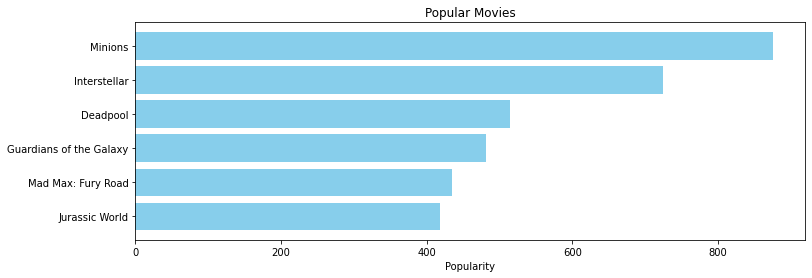

In [11]:
pop= movies.sort_values('popularity', ascending=False)
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.barh(pop['title'].head(6),pop['popularity'].head(6), align='center',
        color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel("Popularity")
plt.title("Popular Movies")

In [12]:
pop[['title','popularity']].head(10)

,title,popularity
546,Minions,875.581305
95,Interstellar,724.247784
788,Deadpool,514.569956
94,Guardians of the Galaxy,481.098624
127,Mad Max: Fury Road,434.278564
28,Jurassic World,418.708552
199,Pirates of the Caribbean: The Curse of the Bla...,271.972889
82,Dawn of the Planet of the Apes,243.791743
200,The Hunger Games: Mockingjay - Part 1,206.227151
88,Big Hero 6,203.734590


In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer
# removing english stop word like a, and , the 
tfidf = TfidfVectorizer(analyzer = 'word',stop_words = 'english')
#NaN -> ‘’
movies['overview'] = movies['overview'].fillna('')
tfidf_matrix = tfidf.fit_transform(movies['overview'])
tfidf_matrix.shape # outputs: (4803, 20978)

(4803, 20978)

In [14]:
from sklearn.metrics.pairwise import linear_kernel
cosin_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [15]:
index_of_movies = pd.Series(movies.index,   index=movies['title']).drop_duplicates()

In [16]:
def get_recommendations(title, cosin_sim=cosin_sim):
    idx = index_of_movies[title]
    
    sim_scores = list(enumerate(cosin_sim[idx]))
    # sorting of moviesidx based on similarity score
    sim_scores = sorted(sim_scores, key = lambda x:x[1], reverse = True)
    # get top 10 of sorted 
    sim_scores = sim_scores[1:31]
    
    movies_idx = [i[0] for i in sim_scores]
    
    return movies['title'].iloc[movies_idx]

In [17]:
get_recommendations('The Godfather').head(10)

2731     The Godfather: Part II
1873                 Blood Ties
867     The Godfather: Part III
3727                 Easy Money
3623                       Made
3125                     Eulogy
3896                   Sinister
4506            The Maid's Room
3783                        Joe
2244      The Cold Light of Day
Name: title, dtype: object

In [18]:
from ast import literal_eval
features = ['cast', 'crew', 'keywords', 'genres']
for f in features:
    movies[f] = movies[f].apply(literal_eval)
# to get director from job
def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return np.nan
# get top 3 elements of list
def get_list(x):
    if isinstance(x, list):
        names = [ i['name'] for i in x]
        
        if len(names)  > 3:
            names = names[:3]
        return names
    return []
#apply all functions
movies['director'] = movies['crew'].apply(get_director)
features = ['cast', 'keywords', 'genres']
for f in features:
    movies[f] = movies[f].apply(get_list)
#striping
def clean_data(x):
    if isinstance(x, list):
        return [str.lower(i.replace(' ', '')) for i in x]
    else:
        if isinstance(x, str):
            return str.lower(x.replace(' ', ''))
        else:
            return ''
features = ['cast', 'keywords', 'director', 'genres']
for f in features:
    movies[f] = movies[f].apply(clean_data)
#creating a SOUP
def create_soup(x):
    return ' '.join(x['keywords'])+' '+' '.join(x['cast'])+' '+x['director']+' '+' '.join(x['genres'])
movies['soup'] = movies.apply(create_soup, axis=1)
#count Vectorizer
from sklearn.feature_extraction.text import CountVectorizer
count = CountVectorizer(stop_words = 'english')
count_matrix = count.fit_transform(movies['soup'])
# finding similarity matrix
from sklearn.metrics.pairwise import cosine_similarity
cosin_sim2 = cosine_similarity(count_matrix, count_matrix)

In [36]:
cosin_sim2[7]

array([0.2, 0.2, 0.2, ..., 0. , 0. , 0. ])

In [20]:
def get_recommendations(title, cosin_sim=cosin_sim):
    idx = index_of_movies[title]
    
    sim_scores = list(enumerate(cosin_sim[idx]))
    # sorting of moviesidx based on similarity score
    sim_scores = sorted(sim_scores, key = lambda x:x[1], reverse = True)
    # get top 10 of sorted 
    sim_scores = sim_scores[1:31]
    
    movies_idx = [i[0] for i in sim_scores]
    
    return movies['title'].iloc[movies_idx]

In [21]:
def recommend(movie):
  movie_index = movies[movies['title'] == movie].index[0]
  distances = cosin_sim2[movie_index]
  movies_list=sorted(list(enumerate(distances)),reverse=True,key=lambda x:x[1])[1:11]

  for i in movies_list:
    print(movies.iloc[i[0]].title)
                                                      

In [22]:
recommend('The Avengers')

Avengers: Age of Ultron
Captain America: Civil War
Iron Man 2
Captain America: The First Avenger
The Incredible Hulk
Captain America: The Winter Soldier
Iron Man 3
X-Men: The Last Stand
Iron Man
Guardians of the Galaxy


In [23]:
recommend('Titanic')

Revolutionary Road
Me You and Five Bucks
The Great Gatsby
All the King's Men
Angel Eyes
The Reader
Sense and Sensibility
Romeo + Juliet
Little Children
What's Eating Gilbert Grape


In [24]:
get_recommendations('The Avengers',cosin_sim2).head(10)

7                  Avengers: Age of Ultron
26              Captain America: Civil War
79                              Iron Man 2
169     Captain America: The First Avenger
174                    The Incredible Hulk
85     Captain America: The Winter Soldier
31                              Iron Man 3
33                   X-Men: The Last Stand
68                                Iron Man
94                 Guardians of the Galaxy
Name: title, dtype: object

In [25]:
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate
reader = Reader()
ratings = pd.read_csv('/content/dataset/datasets/ratings_small.csv')

In [26]:
SVD

surprise.prediction_algorithms.matrix_factorization.SVD

In [27]:
data=Dataset.load_from_df(ratings[['userId','movieId','rating']], reader)
svd=SVD()
#Run 5-fold cross validation and print results
cross_validate(svd,data,measures=['RMSE'],cv=5,verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.8933  0.8938  0.8872  0.9005  0.9041  0.8958  0.0059  
Fit time          4.20    4.16    4.24    4.25    4.16    4.20    0.04    
Test time         0.23    0.12    0.25    0.14    0.20    0.19    0.05    


{'fit_time': (4.196699857711792,
  4.160135746002197,
  4.243422508239746,
  4.253077030181885,
  4.158492565155029),
 'test_rmse': array([0.89330417, 0.89376196, 0.88724377, 0.90047932, 0.90409175]),
 'test_time': (0.22867274284362793,
  0.11999654769897461,
  0.2450881004333496,
  0.14408206939697266,
  0.20045924186706543)}

In [29]:
train = data.build_full_trainset()
svd.fit(train)

In [50]:
svd.predict(23, 7)

Prediction(uid=23, iid=7, r_ui=None, est=2.839592081131321, details={'was_impossible': False})

In [34]:
# convert float val to int
def conv_int(x):
    try:
        return int(x)
    except:
        return np.nan

In [35]:
movie_id = pd.read_csv('/content/dataset/datasets/links.csv')[['movieId', 'tmdbId']]
movie_id['tmdbId'] = movie_id['tmdbId'].apply(conv_int)
movie_id.columns = ['movieId', 'id']
movie_id = movie_id.merge(movies[['title', 'id']], on='id').set_index('title')
print(movie_id.shape) # o/p: (4599, 2)
movie_id

(4599, 2)


,movieId,id
title,,
Toy Story,1,862.0
GoldenEye,10,710.0
The American President,11,9087.0
Nixon,14,10858.0
Cutthroat Island,15,1408.0
...,...,...
Christmas Mail,172347,76706.0
Good Intentions,172853,34417.0
Growing Up Smith,173857,426469.0


In [37]:
index_map = movie_id.set_index('id')


In [ ]:
def recommend_for(userId, title):
    index = index_of_movies[title]
    tmdbId = movie_id.loc[title]['id']
      

    #content based
    sim_scores = list(enumerate(cosin_sim2[int(index)]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[11:21]
    movie_indices = [i[0] for i in sim_scores]

    mv = movies.iloc[movie_indices][['title', 'vote_count', 'vote_average', 'id']]
    mv = mv[mv['id'].isin(movie_id['id'])]
    print(mv)
    # CF
    mv['est'] = mv['id'].apply(lambda x: svd.predict(userId, index_map.loc[x]['movieId']).est)
    mv = mv.sort_values('est', ascending=False)
    return mv.head(10)

In [53]:
def recommend_for(userId, title):
    index = index_of_movies[title]
    tmdbId = movie_id.loc[title]['id']
      

    #content based
    sim_scores = list(enumerate(cosin_sim2[int(index)]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:11]
    movie_indices = [i[0] for i in sim_scores]

    mv = movies.iloc[movie_indices][['title', 'vote_count', 'vote_average', 'id']]
    mv = mv[mv['id'].isin(movie_id['id'])]
    #movieslist = mv['title']
    #print(movieslist)
    print(mv)
    # CF
    mv['est'] = mv['id'].apply(lambda x: svd.predict(userId, index_map.loc[x]['movieId']).est)
    mv = mv.sort_values('est', ascending=False)
    return mv.head(10)
    

In [48]:
recommend_for(624,'Avatar')

                                        title  vote_count  vote_average     id
206                       Clash of the Titans        2233           5.6  18823
71      The Mummy: Tomb of the Dragon Emperor        1387           5.2   1735
103                 The Sorcerer's Apprentice        1470           5.8  27022
131                                   G-Force         510           5.1  19585
215    Fantastic 4: Rise of the Silver Surfer        2589           5.4   1979
466                          The Time Machine         631           5.8   2135
715                         The Scorpion King         779           5.3   9334
1    Pirates of the Caribbean: At World's End        4500           6.9    285
5                                Spider-Man 3        3576           5.9    559
No such user


In [ ]:
recommend_for(4,'Titanic')

                            title  vote_count  vote_average     id
1081           Revolutionary Road         796           6.7   4148
49               The Great Gatsby        3769           7.3  64682
872            All the King's Men          95           5.7   1717
1311                   Angel Eyes          88           5.6   5852
1492                   The Reader         813           7.2   8055
2449        Sense and Sensibility         352           7.2   4584
2661               Romeo + Juliet        1374           6.7    454
2701              Little Children         240           6.9   1440
2946  What's Eating Gilbert Grape         919           7.5   1587


,title,vote_count,vote_average,id,est
2449,Sense and Sensibility,352,7.2,4584,4.467458
2946,What's Eating Gilbert Grape,919,7.5,1587,4.394662
2701,Little Children,240,6.9,1440,4.325275
1492,The Reader,813,7.2,8055,4.222443
49,The Great Gatsby,3769,7.3,64682,4.210129
1081,Revolutionary Road,796,6.7,4148,4.184054
872,All the King's Men,95,5.7,1717,4.151978
1311,Angel Eyes,88,5.6,5852,4.027180
2661,Romeo + Juliet,1374,6.7,454,3.853852


In [ ]:
import pickle

In [ ]:
movies.to_dict()

{'budget': {0: 237000000,
  1: 300000000,
  2: 245000000,
  3: 250000000,
  4: 260000000,
  5: 258000000,
  6: 260000000,
  7: 280000000,
  8: 250000000,
  9: 250000000,
  10: 270000000,
  11: 200000000,
  12: 200000000,
  13: 255000000,
  14: 225000000,
  15: 225000000,
  16: 220000000,
  17: 380000000,
  18: 225000000,
  19: 250000000,
  20: 215000000,
  21: 200000000,
  22: 250000000,
  23: 180000000,
  24: 207000000,
  25: 200000000,
  26: 250000000,
  27: 209000000,
  28: 150000000,
  29: 200000000,
  30: 200000000,
  31: 200000000,
  32: 200000000,
  33: 210000000,
  34: 200000000,
  35: 150000000,
  36: 210000000,
  37: 200000000,
  38: 200000000,
  39: 170000000,
  40: 200000000,
  41: 200000000,
  42: 200000000,
  43: 200000000,
  44: 190000000,
  45: 200000000,
  46: 250000000,
  47: 190000000,
  48: 195000000,
  49: 105000000,
  50: 150000000,
  51: 180000000,
  52: 195000000,
  53: 185000000,
  54: 175000000,
  55: 185000000,
  56: 185000000,
  57: 180000000,
  58: 14000000

In [ ]:
pickle.dump(movies.to_dict(),open('movies_dict.pkl','wb'))

In [ ]:
pickle.dump(movie_id,open('moviesid.pkl','wb'))

In [ ]:
pickle.dump(svd,open('svd.pkl','wb'))

In [ ]:
pickle.dump(movies, open('model.pkl','wb'))

In [ ]:
pickle.dump(cosin_sim2 , open('similarity.pkl','wb'))


In [ ]:
import bz2
import pickle
import _pickle as cPickle

In [ ]:
def compressed_pickle(title, data):
  with bz2.BZ2File(title + '.pbz2' , 'w') as f: 
    cPickle.dump(data, f)

In [ ]:
compressed_pickle('Similarity', cosin_sim2) 

In [ ]:
compressed_pickle('movies_dict', movies.to_dict()) 

In [ ]:
pickle.dump(movies , open('movie.pkl','wb'))